# QWOP

http://web.stanford.edu/class/cs168/p7.pdf (part 3)

Ideas/optimizations we used:
- The instructions are in pairs (thigh + knee), so it makes sense to try to update them in these pairs too.
- We can update several values (or pairs of values) in one iterations. We tried 1-4 values/pairs per iteration.
- There's no point in updating instructions controlling movements after we died.
- If some trial has reached a good score, let it run longer.
- Accept changes reducing the score, with low probability.
- Tried both updating instructions to random values within [-1, 1] and adding random delta between -1 and 1.

Overall approach:
- Implemented MCMC, with various hyperparameters.
- Used a grid search with a small number of trials per configuration and a small number of iterations per trial to find good configurations (score ~8).
- Picked a good configuration and ran it with many more trials and many more iterations per trial. Allowed each trial to run almost indefinitely as long as it was improving. Reached score >9.
- Took the best plan and ran more trials initialized from it (rather than initialized randomly). Again, let the trials run almost indefinitely as long as they were improving. Reached score >10.

Final best score: 10.030859026345876

Best plan: [0.3685007260439699, 1, 0.5049565316276989, 0.800572829376007, 1, 0.9465351605982479, 0.2607707044189127, 1, -0.4074502530843982, -0.9288840397218932, -0.8361866374702824, -1, 1, 1, 0.3157585761265631, 1, -1, -0.8417411604698721, -1, 0.7246018921849671, -1, -1, -0.2967086328165276, -1, 1, 1, -1, -0.1632243673409841, 1, -0.34643979590036267, 0.7606717822812359, 1, -0.07578597496586159, 1, -0.8542893814669759, -1, 0.4439275801197171, 1, -0.8844362051117647, 1]

In [1]:
# Borrowed from http://web.stanford.edu/class/cs168/qwop.py
#
# This code is based on an assignment designed by Paul Valiant.  
# Please do not disseminate this code without his written permission.
#
# This python implementation was written by Okke Schrijvers for CS168

import sys
import math
import numpy as np
import time
from matplotlib import pyplot as plt
from matplotlib import animation
import copy
import random


# plan is an array of 40 floating point numbers
def sim(plan, withdata):
    if withdata:
        data = []
    else:
        data = 0
    for i in range(0, len(plan)):
        if plan[i] > 1:
            plan[i] = 1.0
        elif plan[i] < -1:
            plan[i] = -1.0

    dt = 0.1
    friction = 1.0
    gravity = 0.1
    mass = [30, 10, 5, 10, 5, 10]
    edgel = [0.5, 0.5, 0.5, 0.5, 0.9]
    edgesp = [160.0, 180.0, 160.0, 180.0, 160.0]
    edgef = [8.0, 8.0, 8.0, 8.0, 8.0]
    anglessp = [20.0, 20.0, 10.0, 10.0]
    anglesf = [8.0, 8.0, 4.0, 4.0]
    
    edge = [(0, 1),(1, 2),(0, 3),(3, 4),(0, 5)]
    angles = [(4, 0),(4, 2),(0, 1),(2, 3)]
    
    # vel and pos of the body parts, 0 is hip, 5 is head, others are joints
    v = [[0.0,0.0,0.0,0.0,0.0,0.0], [0.0,0.0,0.0,0.0,0.0,0.0]]
    p = [[0, 0, -.25, .25, .25, .15], [1, .5, 0, .5, 0, 1.9]]
    
    spin = 0.0
    maxspin = 0.0
    lastang = 0.0
    
    for j in range(20):
        for k in range(10):
            lamb = 0.05 + 0.1*k
            t0 = 0.5
            if j>0:
                t0 = plan[2*j-2]
            t0 *= (1-lamb)
            t0 += plan[2*j]*lamb
            
            t1 = 0.0
            if j>0:
                t1 = plan[2*j-1]
            t1 *= (1-lamb)
            t1 += plan[2*j+1]*lamb
            
            

            contact = [False,False,False,False,False,False]
            for z in range(6):
                if p[1][z] <= 0:
                    contact[z] = True
                    spin = 0
                    p[1][z] = 0

            anglesl = [-(2.8+t0), -(2.8-t0), -(1-t1)*.9, -(1+t1)*.9]

            disp = [[0,0,0,0,0],[0,0,0,0,0]]
            dist = [0,0,0,0,0]
            dispn = [[0,0,0,0,0],[0,0,0,0,0]]
            for z in range(5):
                disp[0][z] = p[0][edge[z][1]]-p[0][edge[z][0]]
                disp[1][z] = p[1][edge[z][1]]-p[1][edge[z][0]]
                dist[z] = math.sqrt(disp[0][z]*disp[0][z] + disp[1][z]*disp[1][z]) + 0.01
                inv = 1.0/dist[z];
                dispn[0][z] = disp[0][z]*inv
                dispn[1][z] = disp[1][z]*inv;
        
            dispv = [[0,0,0,0,0],[0,0,0,0,0]]
            distv = [0,0,0,0,0]
            for z in range(5):
                dispv[0][z] = v[0][edge[z][1]] - v[0][edge[z][0]]
                dispv[1][z] = v[1][edge[z][1]] - v[1][edge[z][0]]
                distv[z] = 2*(disp[0][z]*dispv[0][z] + disp[1][z]*dispv[1][z])

            
            forceedge = [[0,0,0,0,0],[0,0,0,0,0]]
            for z in range(5):
                c = (edgel[z]-dist[z])*edgesp[z]-distv[z]*edgef[z]
                forceedge[0][z] = c*dispn[0][z]
                forceedge[1][z] = c*dispn[1][z]

            edgeang = [0,0,0,0,0]
            edgeangv = [0,0,0,0,0]
            for z in range(5):
                edgeang[z] = math.atan2(disp[1][z], disp[0][z])
                edgeangv[z] = (dispv[0][z]*disp[1][z]-dispv[1][z]*disp[0][z])/(dist[z]*dist[z])

            inc = edgeang[4] - lastang
            if (inc < -math.pi):
                inc += 2.0 * math.pi
            elif inc > math.pi:
                inc -= 2.0 * math.pi
            spin += inc
            spinc = spin - .005*(k + 10 * j)
            if spinc > maxspin:
                maxspin = spinc
                lastang = edgeang[4]

            angv = [0,0,0,0]
            for z in range(4):
                angv[z] = edgeangv[angles[z][1]]-edgeangv[angles[z][0]];

            angf = [0,0,0,0]
            for z in range(4):
                ang = edgeang[angles[z][1]]-edgeang[angles[z][0]]-anglesl[z]
                if ang > math.pi:
                    ang -= 2*math.pi
                elif ang < -math.pi:
                    ang += 2*math.pi
                m0 = dist[angles[z][0]]/edgel[angles[z][0]]
                m1 = dist[angles[z][1]]/edgel[angles[z][1]]
                angf[z] = ang*anglessp[z]-angv[z]*anglesf[z]*min(m0,m1)

            edgetorque = [[0,0,0,0,0],[0,0,0,0,0]]
            for z in range(5):
                inv = 1.0 / (dist[z]*dist[z])
                edgetorque[0][z] = -disp[1][z]*inv
                edgetorque[1][z] =  disp[0][z]*inv

            for z in range(4):
                i0 = angles[z][0]
                i1 = angles[z][1]
                forceedge[0][i0] += angf[z]*edgetorque[0][i0]
                forceedge[1][i0] += angf[z]*edgetorque[1][i0]
                forceedge[0][i1] -= angf[z]*edgetorque[0][i1]
                forceedge[1][i1] -= angf[z]*edgetorque[1][i1]

            f = [[0,0,0,0,0,0],[0,0,0,0,0,0]]
            for z in range(5):
                i0 = edge[z][0]
                i1 = edge[z][1]
                f[0][i0] -= forceedge[0][z]
                f[1][i0] -= forceedge[1][z]
                f[0][i1] += forceedge[0][z]
                f[1][i1] += forceedge[1][z]

            for z in range(6):
                f[1][z] -= gravity*mass[z]
                invm = 1.0/mass[z]
                v[0][z] += f[0][z]*dt*invm
                v[1][z] += f[1][z]*dt*invm
                
                if contact[z]:
                    fric = 0.0
                    if v[1][z] < 0.0:
                        fric = -v[1][z]
                        v[1][z] = 0.0

                    s = np.sign(v[0][z])
                    if v[0][z]*s < fric*friction:
                        v[0][z]=0
                    else:
                        v[0][z] -= fric*friction*s
                p[0][z] += v[0][z] * dt
                p[1][z] += v[1][z] * dt;

            if withdata:
                data.append(copy.deepcopy(p))
            else:
                data += 1

            if contact[0] or contact[5]:
                return p[0][5], data
    return p[0][5], data

In [2]:
# Adapted from http://web.stanford.edu/class/cs168/qwop.py

def do_draw(data):
    # draw the simulation
    fig = plt.figure()
    fig.set_dpi(100)
    fig.set_size_inches(12, 3)

    ax = plt.axes(xlim=(-1, 10), ylim=(0, 3))

    joints = [5, 0, 1, 2, 1, 0, 3, 4]
    patch = plt.Polygon([[0,0],[0,0]],closed=None, fill=None, edgecolor='k')
    head = plt.Circle((0, 0), radius=0.15, fc='k', ec='k')

    def init():
        ax.add_patch(patch)
        ax.add_patch(head)
        return patch,head


    def animate(j):
        points = list(zip([data[j][0][i] for i in joints], [data[j][1][i] for i in joints]))
        patch.set_xy(points)
        head.center = (data[j][0][5], data[j][1][5])
        return patch,head

    anim = animation.FuncAnimation(fig, animate,
                                   init_func=init,
                                   frames=len(data),
                                   interval=20)
    anim.save('out/p7/animation.mp4', fps=50)

    plt.show()

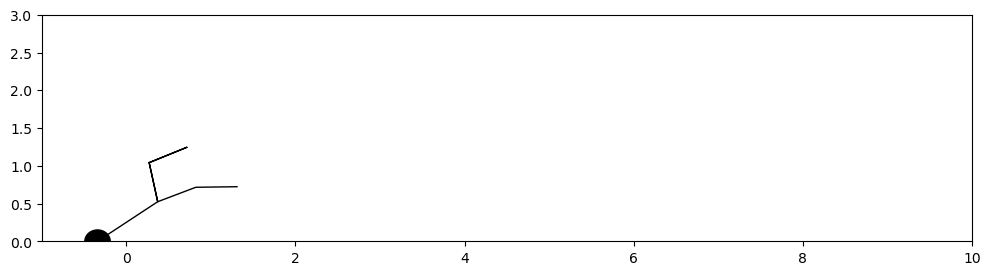

In [3]:
# Trying out the library

plan = [random.uniform(-1,1) for i in range(40)]

val, data = sim(plan, withdata=True)
do_draw(data)

In [4]:
def mcmc(score_decrease_tolerance, max_delta, maxiter, miniter, minincscore, update_pairs, before_crash, update_count, init=None):
    if init is None:
        plan = [random.uniform(-1,1) for i in range(40)]
    else:
        plan = init.copy()
    bestplan = plan
    score, simres = sim(plan, withdata=False)
    bestscore = score
    bestit = -1
    scores = [score]
    itlimit = miniter
    it = 0
    while it < itlimit:
        if before_crash:
            steps_to_optimize = int(math.ceil(simres) / 10)
        else:
            steps_to_optimize = len(plan) / 2
        
        pos = []
        for _ in range(update_count):
            step = random.randrange(steps_to_optimize)
            if update_pairs:
                pos += [step * 2, step * 2 + 1]
            else:
                pos += [step * 2 + random.randrange(2)]
            
        newplan = plan.copy()
        for p in pos:
            if max_delta is not None:
                delta = random.uniform(-max_delta, max_delta)        
                newplan[p] = plan[p] + delta
            else:
                newplan[p] = random.uniform(-1, 1)
            if newplan[p] > 1:
                newplan[p] = 1
            elif newplan[p] < -1:
                newplan[p] = -1
        
        newscore, newsimres = sim(newplan, withdata=False)
        
        if newscore > score:
            # Improved
            plan = newplan
            score = newscore
            simres = newsimres
        elif score_decrease_tolerance > 0 and random.uniform(0, 1) < math.exp((newscore - score) / score_decrease_tolerance):
            # Worse, but let's take it
            plan = newplan
            score = newscore
            simres = newsimres
        else:
            # Worse
            pass
        if newscore > bestscore:
            bestscore = newscore
            bestplan = newplan
            bestit = it
        scores.append(score)
        
        it += 1
        if it >= itlimit and it < maxiter:
            if bestscore >= minincscore and (it - bestit < miniter):
                toinc = miniter * 3
                print(f"Extending itlimit {itlimit} by {toinc}. score={bestscore}, reached on iteration={bestit}")
                itlimit += toinc
    return bestscore, bestplan, scores

Extending itlimit 100 by 300. score=4.895102977774033, reached on iteration=71
Extending itlimit 400 by 300. score=5.156379843589423, reached on iteration=369
5.635896973605301


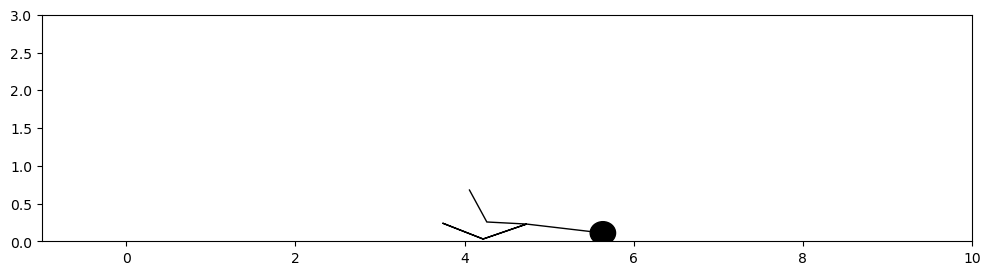

In [5]:
# Experimenting

s, p, _ = mcmc(score_decrease_tolerance=0.01, max_delta=None, maxiter=500, miniter=100, minincscore=3, update_pairs=True, before_crash=True, update_count=4)
print(s)
_, a = sim(p, withdata=True)
do_draw(a)

In [6]:
# Search hyperparameters

#NUMTRIALS = 10
# NUMTRIALS = 10
# SCORE_DECREASE_TOLERANCES = [0, 0.01, 0.05, 0.1]
# MAX_DELTAS = [0.1, 1.0]
# MAX_ITER = 100
# UPDATE_PAIRS = [False, True]
# BEFORE_CRASH = [False, True]
# UPDATE_COUNT = [1, 2, 3, 4]

NUMTRIALS = 10
SCORE_DECREASE_TOLERANCES = [0.0, 0.01, 0.1]
MAX_DELTAS = [0.1, 1.0, None]
MIN_ITER = 100
MAX_ITER = 1000
MIN_INC_SCORE = 7.5
UPDATE_PAIRS = [True, False]
BEFORE_CRASH = [True, False]
UPDATE_COUNT = [1, 2, 3, 4]

configs = []
configstructs = []
scores = []
planbestscores = []

bestscore = -100
bestplan = []
bestconfig = None

config_index = 0
trial_index = 0
total_configs = len(SCORE_DECREASE_TOLERANCES) * len(MAX_DELTAS) * len(UPDATE_PAIRS) * len(BEFORE_CRASH) * len(UPDATE_COUNT)
total_trials = total_configs * NUMTRIALS
for score_decrease_tolerance in SCORE_DECREASE_TOLERANCES:
    for max_delta in MAX_DELTAS:
        for update_pairs in UPDATE_PAIRS:
            for before_crash in BEFORE_CRASH:
                for update_count in UPDATE_COUNT:
                    config = f"score_decrease_tolerance={score_decrease_tolerance}, max_delta={max_delta}, update_pairs={update_pairs}, before_crash={before_crash}, update_count={update_count}, min_iter={MIN_ITER}, max_iter={MAX_ITER}"
                    configstructs.append({
                        'score_decrease_tolerance': score_decrease_tolerance,
                        'max_delta': max_delta,
                        'update_pairs': update_pairs,
                        'before_crash': before_crash,
                        'update_count': update_count
                    })
                    config_index += 1
                    print(f"{config_index}/{total_configs} {config}")
                    configs.append(config)
                    row = []
                    planbestscoresrow = []

                    bestscoreforconfig = -100
                    for trial in range(NUMTRIALS):
                        trial_index += 1
                        if trial_index % 5 == 1:
                            print(f"Trial #{trial_index}/{total_trials}")
                        score, plan, planscores = mcmc(score_decrease_tolerance=score_decrease_tolerance, max_delta=max_delta, maxiter=MAX_ITER, update_pairs=update_pairs, before_crash=before_crash, update_count=update_count, miniter=MIN_ITER, minincscore=MIN_INC_SCORE)
                        row.append(planscores)
                        planbestscoresrow.append(score)

                        if score > bestscore:
                            print(f"##### New best score: {score}, config={config}")
                            bestscore = score
                            bestplan = plan
                            bestconfig = config
                        if score > bestscoreforconfig:
                            bestscoreforconfig = score                        
                    print(f"Best score for config: {bestscoreforconfig}")
                    print()
                    scores.append(row)
                    planbestscores.append(planbestscoresrow)
                    
print(f"Final best score: {bestscore}, config={bestconfig}, plan={bestplan}")
                
print("Done!")

1/144 score_decrease_tolerance=0.0, max_delta=0.1, update_pairs=True, before_crash=True, update_count=1, min_iter=100, max_iter=1000
Trial #1/1440
##### New best score: 0.9267324318387824, config=score_decrease_tolerance=0.0, max_delta=0.1, update_pairs=True, before_crash=True, update_count=1, min_iter=100, max_iter=1000
##### New best score: 2.0132237640736266, config=score_decrease_tolerance=0.0, max_delta=0.1, update_pairs=True, before_crash=True, update_count=1, min_iter=100, max_iter=1000
##### New best score: 2.3132865544730614, config=score_decrease_tolerance=0.0, max_delta=0.1, update_pairs=True, before_crash=True, update_count=1, min_iter=100, max_iter=1000
Trial #6/1440
##### New best score: 2.7048589035922324, config=score_decrease_tolerance=0.0, max_delta=0.1, update_pairs=True, before_crash=True, update_count=1, min_iter=100, max_iter=1000
Best score for config: 2.7048589035922324

2/144 score_decrease_tolerance=0.0, max_delta=0.1, update_pairs=True, before_crash=True, upd

Trial #296/1440
Best score for config: 5.970451324237297

31/144 score_decrease_tolerance=0.0, max_delta=1.0, update_pairs=False, before_crash=False, update_count=3, min_iter=100, max_iter=1000
Trial #301/1440
Trial #306/1440
Best score for config: 5.288288990165782

32/144 score_decrease_tolerance=0.0, max_delta=1.0, update_pairs=False, before_crash=False, update_count=4, min_iter=100, max_iter=1000
Trial #311/1440
Trial #316/1440
Best score for config: 6.0873165582864575

33/144 score_decrease_tolerance=0.0, max_delta=None, update_pairs=True, before_crash=True, update_count=1, min_iter=100, max_iter=1000
Trial #321/1440
Trial #326/1440
Best score for config: 4.65311903703317

34/144 score_decrease_tolerance=0.0, max_delta=None, update_pairs=True, before_crash=True, update_count=2, min_iter=100, max_iter=1000
Trial #331/1440
Trial #336/1440
Best score for config: 5.680318596311993

35/144 score_decrease_tolerance=0.0, max_delta=None, update_pairs=True, before_crash=True, update_count=

Best score for config: 5.081066563652854

70/144 score_decrease_tolerance=0.01, max_delta=1.0, update_pairs=True, before_crash=False, update_count=2, min_iter=100, max_iter=1000
Trial #691/1440
Trial #696/1440
Best score for config: 6.100747940280008

71/144 score_decrease_tolerance=0.01, max_delta=1.0, update_pairs=True, before_crash=False, update_count=3, min_iter=100, max_iter=1000
Trial #701/1440
Trial #706/1440
Best score for config: 6.9893543506786

72/144 score_decrease_tolerance=0.01, max_delta=1.0, update_pairs=True, before_crash=False, update_count=4, min_iter=100, max_iter=1000
Trial #711/1440
Trial #716/1440
Best score for config: 5.376567943175753

73/144 score_decrease_tolerance=0.01, max_delta=1.0, update_pairs=False, before_crash=True, update_count=1, min_iter=100, max_iter=1000
Trial #721/1440
Trial #726/1440
Best score for config: 5.074280845596811

74/144 score_decrease_tolerance=0.01, max_delta=1.0, update_pairs=False, before_crash=True, update_count=2, min_iter=100

Trial #1076/1440
Best score for config: 4.9674112182636

109/144 score_decrease_tolerance=0.1, max_delta=0.1, update_pairs=False, before_crash=False, update_count=1, min_iter=100, max_iter=1000
Trial #1081/1440
Trial #1086/1440
Best score for config: 3.910569438689125

110/144 score_decrease_tolerance=0.1, max_delta=0.1, update_pairs=False, before_crash=False, update_count=2, min_iter=100, max_iter=1000
Trial #1091/1440
Trial #1096/1440
Best score for config: 2.8350818687199335

111/144 score_decrease_tolerance=0.1, max_delta=0.1, update_pairs=False, before_crash=False, update_count=3, min_iter=100, max_iter=1000
Trial #1101/1440
Trial #1106/1440
Best score for config: 3.884400728380323

112/144 score_decrease_tolerance=0.1, max_delta=0.1, update_pairs=False, before_crash=False, update_count=4, min_iter=100, max_iter=1000
Trial #1111/1440
Trial #1116/1440
Best score for config: 3.4138526167441836

113/144 score_decrease_tolerance=0.1, max_delta=1.0, update_pairs=True, before_crash=True

In [7]:
# Calculate statistics for hyperparameters

def process_stats(ss, header):
    mn = min(ss)
    mx = max(ss)
    avg = sum(ss) / len(ss)
    print(f'{str(header).ljust(5)}: avg={avg} min={mn} max={mx}')

print('score_decrease_tolerance')
for score_decrease_tolerance in SCORE_DECREASE_TOLERANCES:
    s = []
    for i in range(len(configstructs)):
        if configstructs[i]['score_decrease_tolerance'] == score_decrease_tolerance:
            s += planbestscores[i]
    process_stats(s, score_decrease_tolerance)
print()

print('max_delta')
for max_delta in MAX_DELTAS:
    s = []
    for i in range(len(configstructs)):
        if configstructs[i]['max_delta'] == max_delta:
            s += planbestscores[i]
    process_stats(s, max_delta)
print()

print('update_pairs')
for update_pairs in UPDATE_PAIRS:
    s = []
    for i in range(len(configstructs)):
        if configstructs[i]['update_pairs'] == update_pairs:
            s += planbestscores[i]
    process_stats(s, update_pairs)
print()

print('before_crash')
for before_crash in BEFORE_CRASH:
    s = []
    for i in range(len(configstructs)):
        if configstructs[i]['before_crash'] == before_crash:
            s += planbestscores[i]
    process_stats(s, before_crash)
print()

print('update_count')
for update_count in UPDATE_COUNT:
    s = []
    for i in range(len(configstructs)):
        if configstructs[i]['update_count'] == update_count:
            s += planbestscores[i]
    process_stats(s, update_count)
print()

score_decrease_tolerance
0.0  : avg=2.9173290204735562 min=-1.9956533399737715 max=7.8619597185555845
0.01 : avg=2.9069732373815524 min=-0.8949139968651226 max=6.9893543506786
0.1  : avg=2.947418503840545 min=-2.8986961894395815 max=7.245240084062467

max_delta
0.1  : avg=1.3146294677230759 min=-2.8986961894395815 max=6.2788113006485
1.0  : avg=3.6494362900285813 min=-0.407299915322745 max=7.8619597185555845
None : avg=3.8076550039439945 min=-0.07208065387194751 max=7.245240084062467

update_pairs
True : avg=3.0486730907543484 min=-2.1398963851831647 max=6.9893543506786
False: avg=2.7991407503760866 min=-2.8986961894395815 max=7.8619597185555845

before_crash
True : avg=3.1639822751680016 min=-1.046049768731723 max=7.8619597185555845
False: avg=2.683831565962434 min=-2.8986961894395815 max=6.9893543506786

update_count
1    : avg=2.3354443298505863 min=-2.1398963851831647 max=5.768688807039192
2    : avg=2.9938457599843593 min=-1.3200903446155492 max=6.808065218054356
3    : avg=3.1400

<ipython-input-8-f2ee7de7ffab>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots()


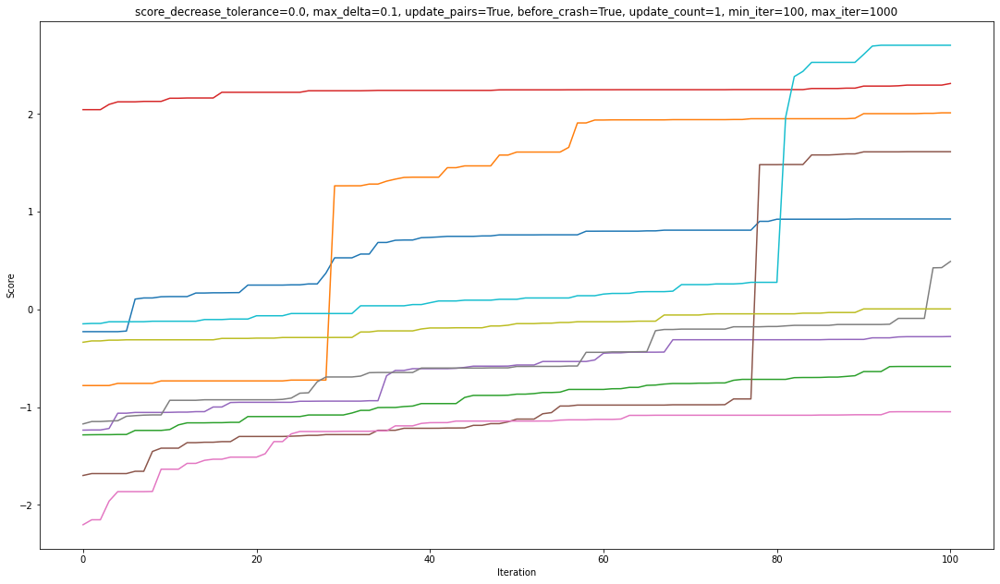

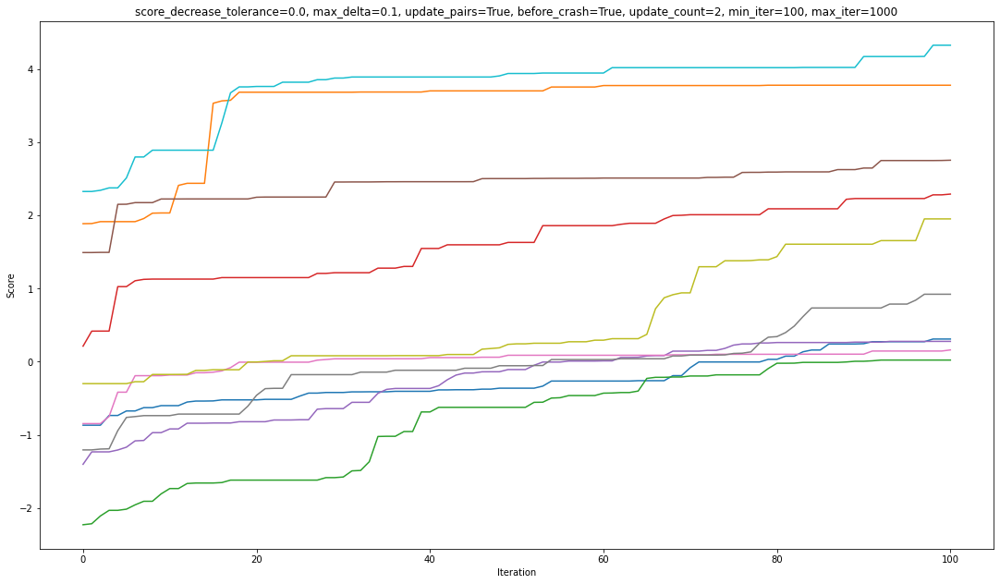

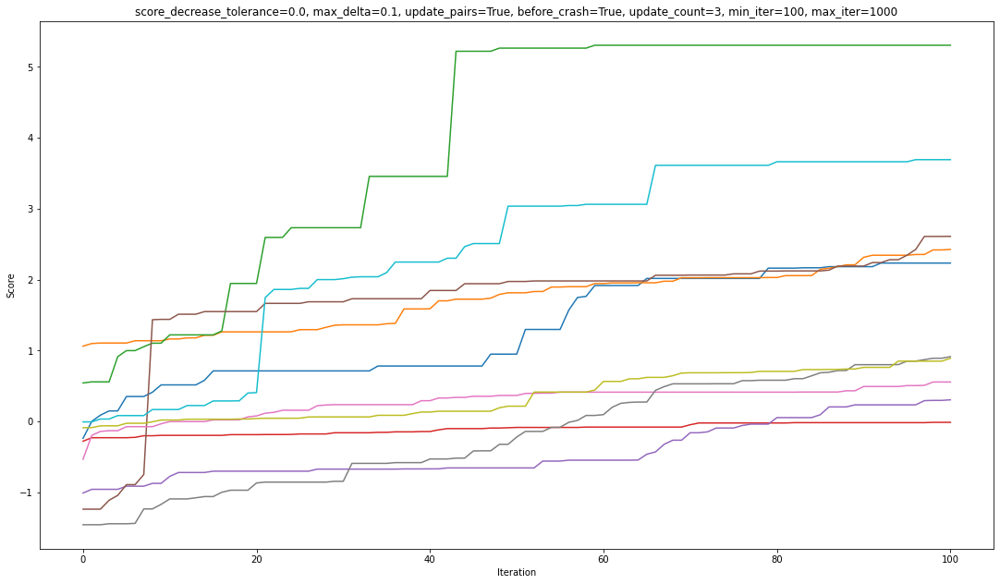

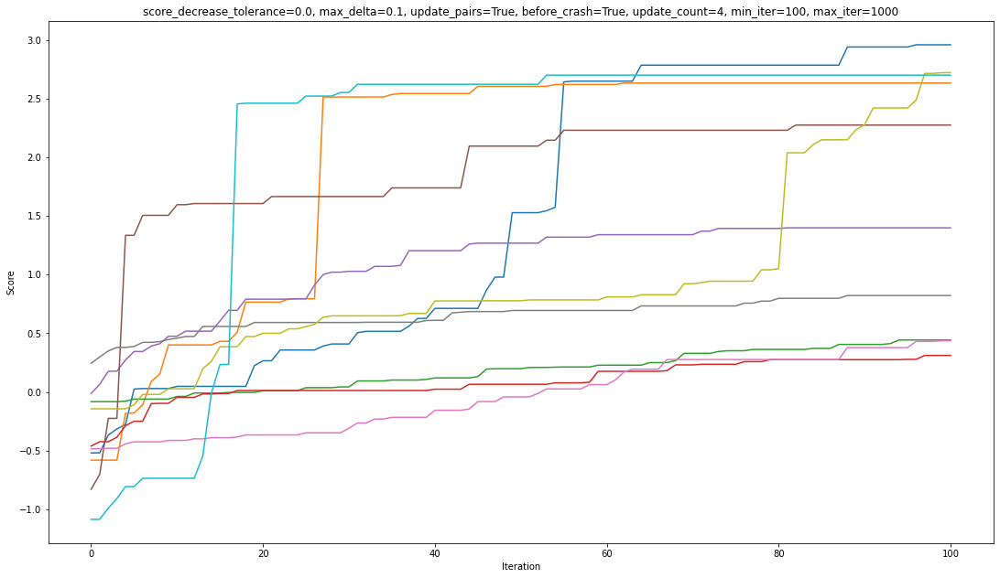

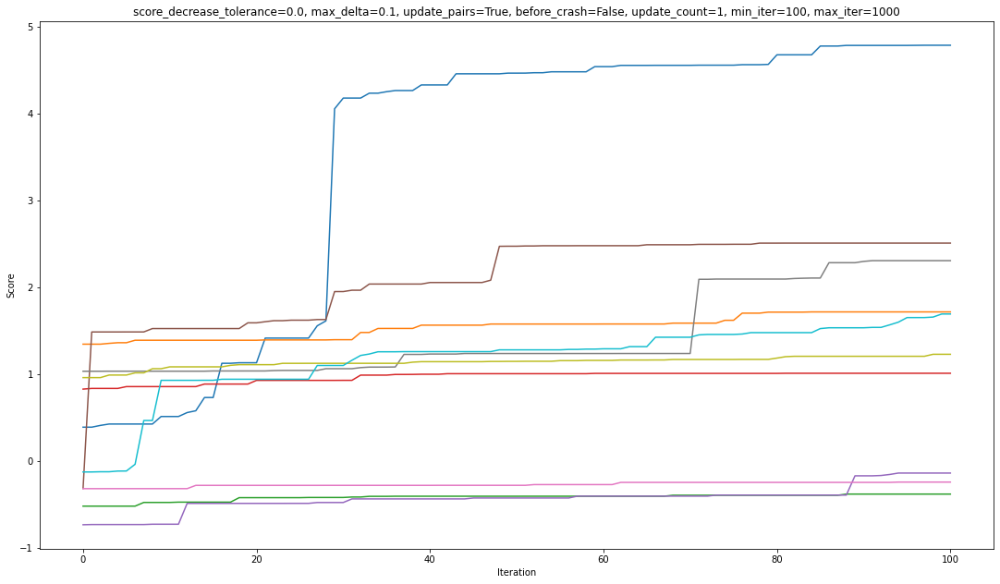

...

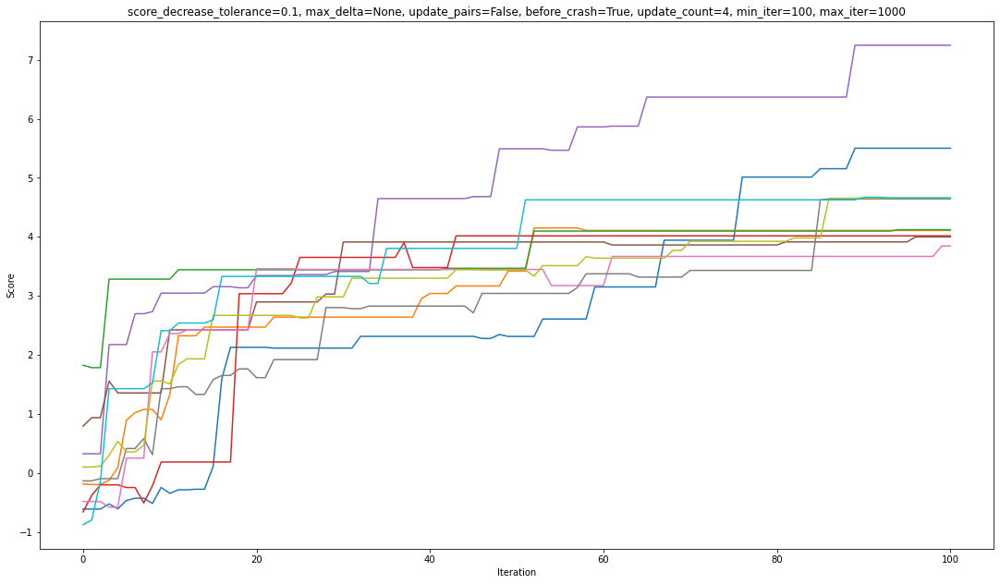

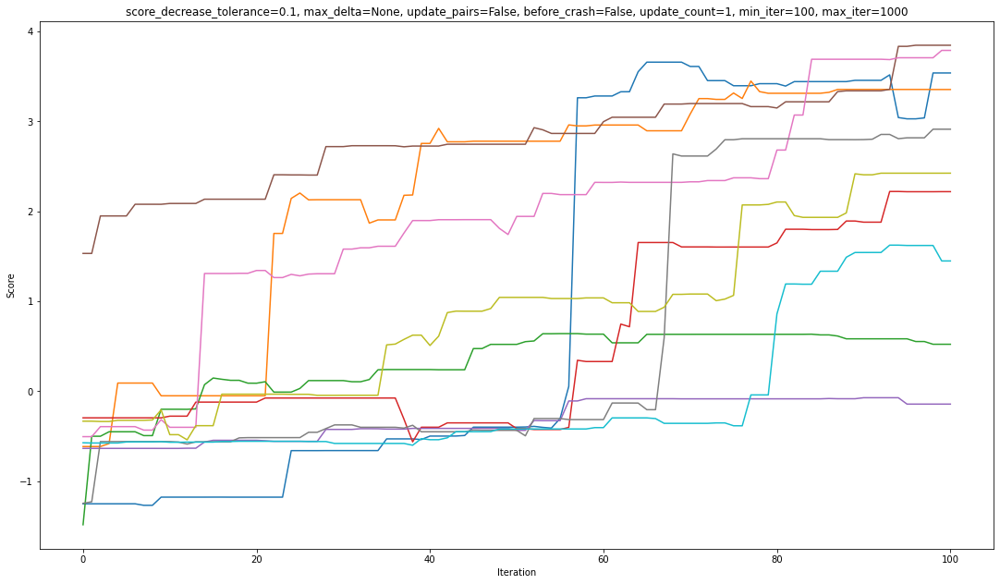

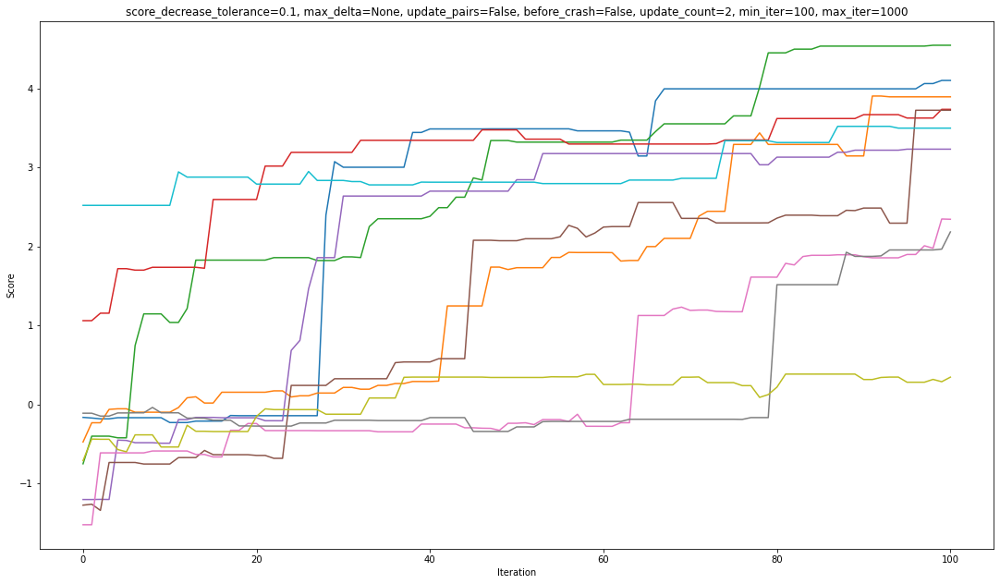

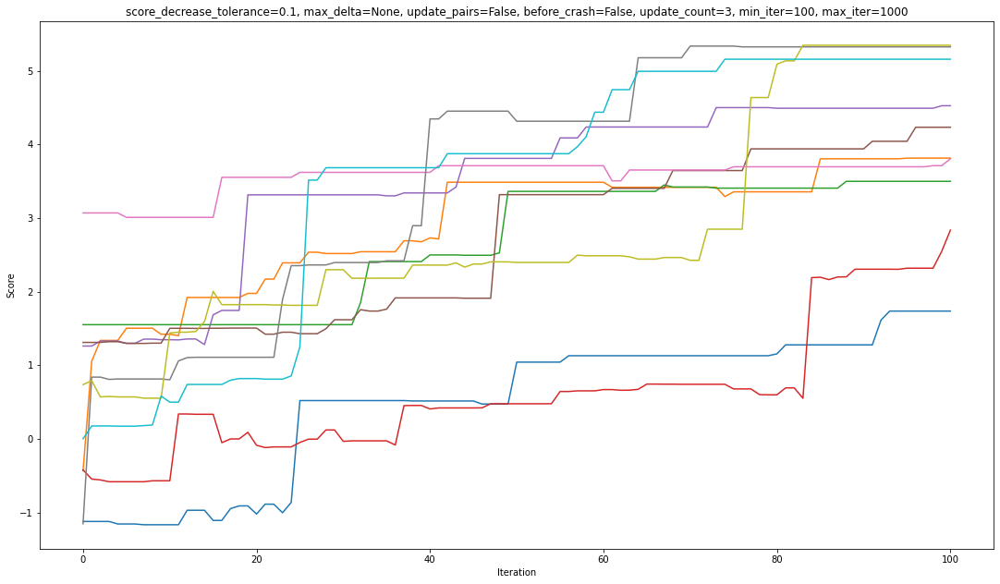

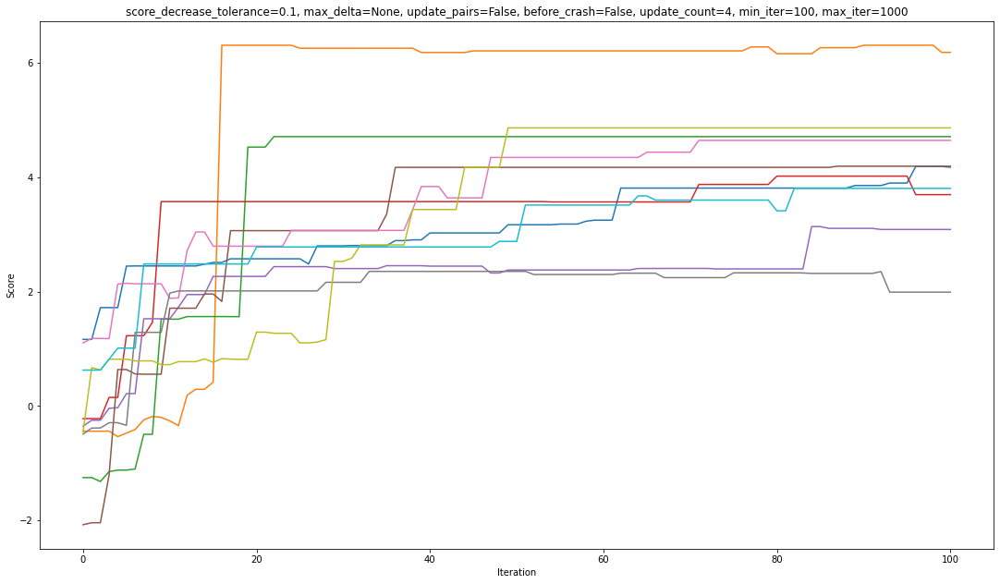

In [8]:
import matplotlib.pyplot as plt

def do_plot(configs, scores):
    assert len(configs) == len(scores)

    for i in range(len(configs)):
        fig, ax1 = plt.subplots()
        fig.set_size_inches(18.5, 10.5)

        ax1.set_xlabel('Iteration')
        ax1.set_ylabel('Score')
        ax1.set_title(configs[i])

        for planscores in scores[i]:
            xs = np.arange(0, len(planscores))
            ax1.plot(xs, planscores)

    plt.show()
    plt.close()

do_plot(configs, scores)

In [9]:
# Fine-tuning a good score we previously obtained.

TO_FINE_TUNE = [0.3685007260439699, 1, 0.5049565316276989, 0.800572829376007, 1, 0.7858419883410779, 0.2607707044189127, 1, -0.21385702192840772, -1, -0.9079285338798042, -1, 0.9798753710100943, 0.7143059009581494, 0.4719681034884493, 1, -1, -0.9073559603959767, -1, 0.8024735575015789, -0.9647427083630378, -1, -0.1573130708343553, -1, 1, 1, -0.9963658287354151, -1, 1, -0.25697391075233433, 1, 1, 0.465837910685015, 1, -0.8480367012295924, -1, 1, -1, -0.11039956964495912, 0.19047261335749144]

for i in range(10):
    print(f"Fine-tune attempt #{i + 1}/100")
    score, plan, planscores = mcmc(init=TO_FINE_TUNE, score_decrease_tolerance=0.01, max_delta=1.0, maxiter=100000, update_pairs=True, before_crash=True, update_count=2, miniter=1000, minincscore=9.0)

    if score > bestscore:
        print(f"##### New best score: {score}, config={config}, plan={bestplan}")
        bestscore = score
        bestplan = plan
        bestconfig = config

print(f"Final best score: {bestscore}, config={bestconfig}, plan={bestplan}")

Fine-tune attempt #1/100
Extending itlimit 1000 by 3000. score=9.299876669807103, reached on iteration=920
Extending itlimit 4000 by 3000. score=9.511807746669485, reached on iteration=3277
##### New best score: 9.511807746669485, config=score_decrease_tolerance=0.1, max_delta=None, update_pairs=False, before_crash=False, update_count=4, min_iter=100, max_iter=1000, plan=[0.455534576751083, 0.7255150899820753, 1, 1, 0.6208309174155644, 1, 0.08614290475192554, -0.06031238625215951, -0.8858080469948229, -1, 1, -0.2398463306809866, 0.8609670481401361, -0.48792057649809983, 0.4649052555192952, 0.9518971149057982, -1, 0.8073748053251086, -0.39294756761647376, -0.8729224235869717, 0.09583154413362749, -0.5561210508811252, 0.7581474823694212, -0.5726703987774171, 0.39466512832450795, 0.4877279553036078, -0.5015286571077873, 0.5901642222723233, 1, 0.013913695024673878, 0.47570854473073654, 1, 0.4649114851147724, 1, -0.45485559536378295, -1, -0.38237473078729045, -0.10377611788853969, 1, 0.8342

10.030859026345876


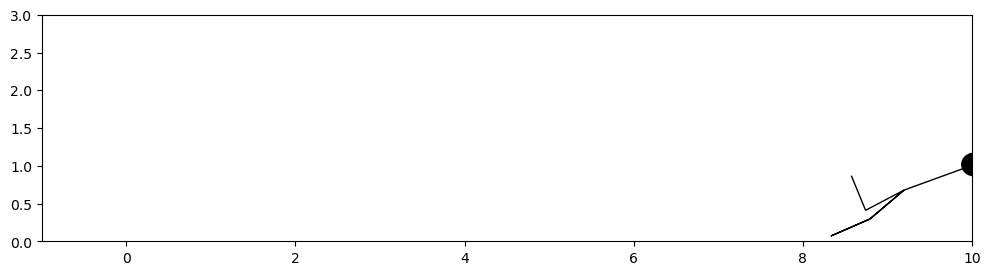

In [10]:
s, p = sim(bestplan, withdata=True)
print(s)
do_draw(p)